In [1]:
using Plots, Measures, LaTeXStrings, LsqFit
using TwoAtomQuenches

## Fig. 1 - Single-Particle Densities

In [2]:
N,xrange,g = 129, 10., 2.5
x,dx = position_grid(N,xrange)
κ_range = [0.7, -0.7]
tspan = 2*π*LinRange(0,1,500)
plots = []

for κ in κ_range
    sys = System(N = N, xrange = xrange, g = g, κ = κ)
    basis = perturbed_basis(sys; save_states = true)
    a = perturbed_coefficients(sys)
    dens = zeros(N,length(tspan))
    for (i,t) in enumerate(tspan)
        dens[:,i] = single_particle_density(evolved_state(a,basis,t),N,dx)
    end    
    push!(plots,heatmap(tspan,x,dens,cmap=:jet))
end

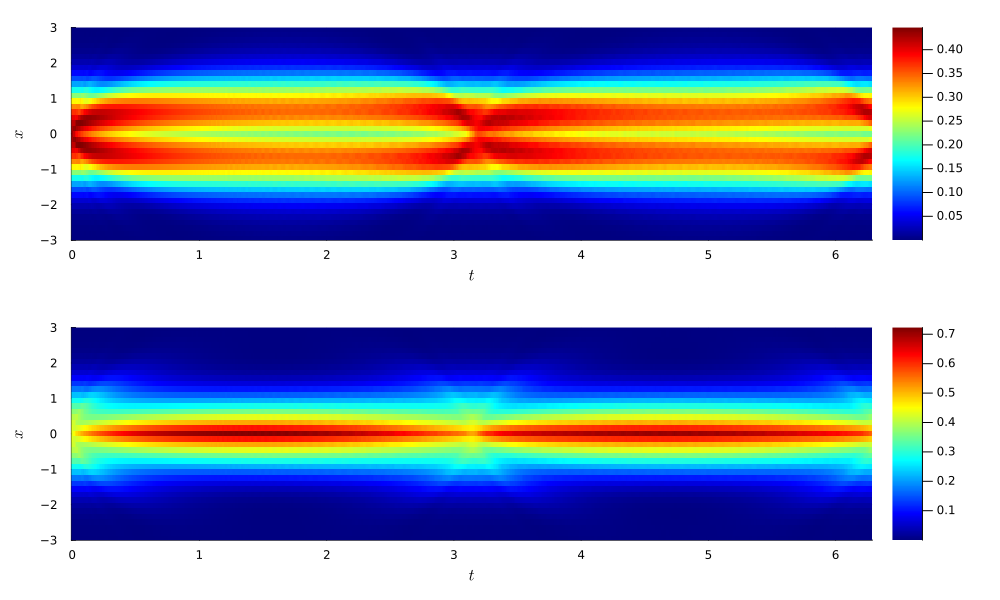

In [3]:
plot(plots...,layout=(2,1),ylims=(-3,3),xlabel=L"t",ylabel=L"x",size=(1000,600),margin=5mm)

The restricted resolution of the Lagrange-mesh method leads to artifacts when calculating the single-particle density via the time-evolved eigenstates. Using a Fourier split-step method as below for the time evolution instead yields better results. 

In [4]:
N,xrange,g = 512, 12., 2.5
x,dx = position_grid(N,xrange)
κ_range = [0.7, -0.7]
tspan = 2*π*LinRange(0,1,500)
dt = 1e-3
steps = Int(round(tspan[end]/(length(tspan)*dt)))
plots = []

for κ in κ_range
    sys = System(N = N, xrange = xrange, g = g, κ = κ)
    E,state = initial_state(sys)
    dens = zeros(N,length(tspan))
    for (i,t) in enumerate(tspan)
        dens[:,i] = sum(abs2.(state); dims = 2)*dx
        state = split_step(sys,state,dt,steps)
    end    
    push!(plots,heatmap(tspan,x,dens,cmap=:jet))
end

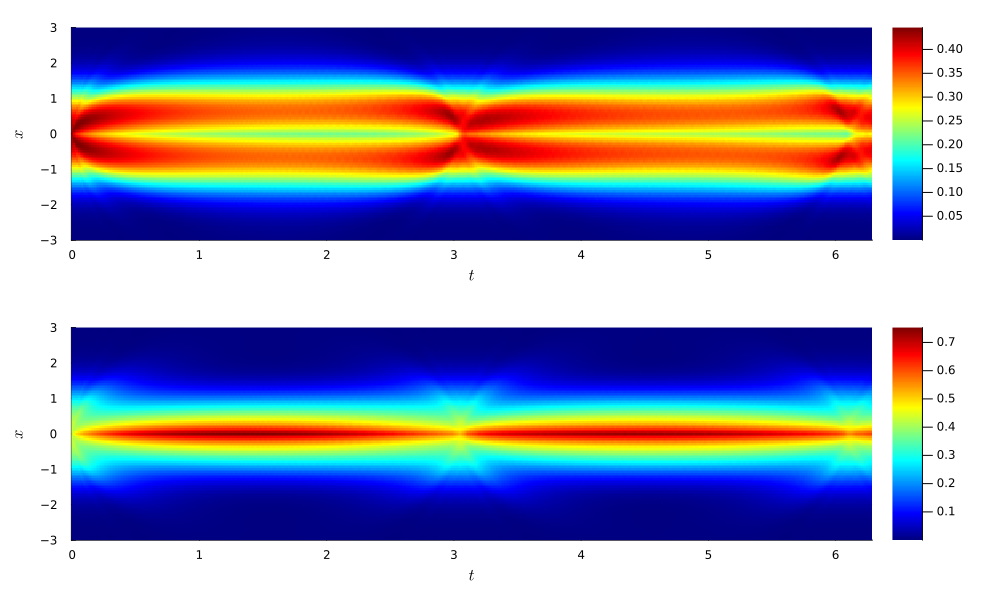

In [5]:
plot(plots...,layout=(2,1),ylims=(-3,3),xlabel=L"t",ylabel=L"x",size=(1000,600),margin=5mm)

## Fig. 2 -  Four Characteristic Quenches

In [6]:
systems = [
    System(N = 129, xrange = 5., g = 0.5, κ = 0.7),
    System(N = 129, xrange = 10., g = 10., κ = 10.),
    System(N = 129, xrange = 5., g = 10., κ = -5.),
    System(N = 129, xrange = 5., g = 2.5, κ = 0.7)
    ]
durations = [5.,10.,2.,15.]
plots = []

for (sys,τ) in zip(systems,durations)
    energies = perturbed_energies(sys)
    a = perturbed_coefficients(sys)
    tspan = 2*π*LinRange(0,τ,Int(τ*200))
    L = [loschmidt_echo(a,energies,t) for t in tspan]
    if sys.κ == 0.7
        lim = (0.86,1.)
    else
        lim = (0.,1.)
    end
    push!(plots,plot(tspan,L,ylims=lim; annotate = (tspan[end]/2,1.,L"g = %$(sys.g)\quad\kappa = %$(sys.κ)")))
end

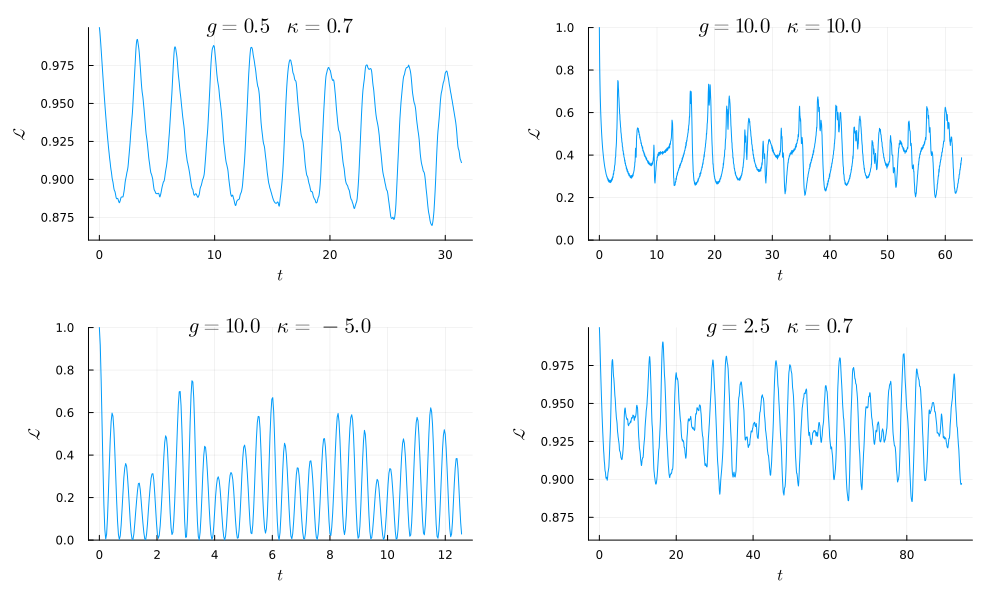

In [7]:
plot(plots...,label="",xlabel=L"t",ylabel=L"\mathcal{L}",size=(1000,600),margin=5mm)

## Fig. 3 - Loschmidt Echo Histograms

In [8]:
N,xrange = 129, 5.
x,dx = position_grid(N,xrange)

g_range = [10., 2.5, 0.5] 
κ_range = [0.2, 0.7, 5., 10., 20.]

tspan = 2*π*LinRange(0,1600,160000)
n_bins = 100
hist_bins = [LinRange(0.98,1.0,n_bins),LinRange(0.86,1.0,n_bins),LinRange(0.,1.,n_bins),LinRange(0.,1.,n_bins),LinRange(0.,1.,n_bins)]
plots = []
ymax = 0

for (κ,bin) in zip(κ_range,hist_bins)
    sys = System(N = N, xrange = xrange, κ = κ)
    energies,a = Tonks_Girardeau(sys)
    L = [loschmidt_echo(a,energies,t) for t in tspan]
    push!(plots,histogram(L; bins = bin,label="",yticks=false,color=:green,linecolor=:match)) 
end
    
for g in g_range    
    for (κ,bin) in zip(κ_range,hist_bins)
        sys = System(N = N, xrange = xrange, g = g, κ = κ)
        energies = perturbed_energies(sys)
        a = perturbed_coefficients(sys)
        L = [loschmidt_echo(a,energies,t) for t in tspan]
        push!(plots,histogram(L; bins = bin,label="",yticks=false,color=:green,linecolor=:match)) 
    end
end

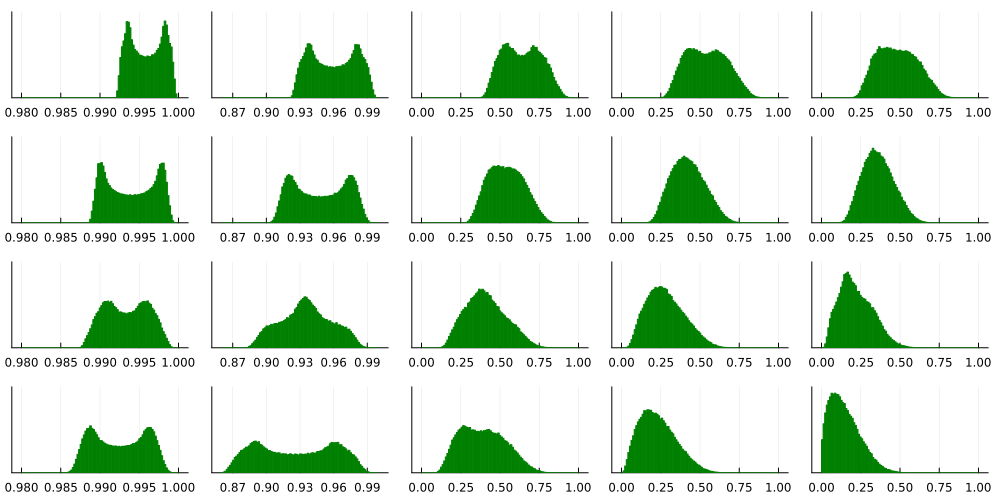

In [9]:
plot(plots...,layout=(length(g_range) + 1,length(κ_range)),ylims=(0,7.5e3),size=(1000,500),margin=1mm)

In [10]:
N,xrange = 129, 5.
x,dx = position_grid(N,xrange)

g_range = [10., 2.5, 0.5] 
κ_range = -[0.2, 0.7, 5., 10., 20.];

tspan = 2*π*LinRange(0,1600,160000)
n_bins = 100
hist_bins = [LinRange(0.98,1.,n_bins),LinRange(0.8,1.,n_bins),LinRange(0.,1.,n_bins),LinRange(0.,1.,n_bins),LinRange(0.,1.,n_bins)]
plots = []

for (κ,bin) in zip(κ_range,hist_bins)
    sys = System(N = N, xrange = xrange, κ = κ)
    energies,a = Tonks_Girardeau(sys)
    L = [loschmidt_echo(a,energies,t) for t in tspan]
    push!(plots,histogram(L; bins = bin,label="",yticks=false,color=:green,linecolor=:match)) 
end
    
for g in g_range    
    for (κ,bin) in zip(κ_range,hist_bins)
        sys = System(N = N, xrange = xrange, g = g, κ = κ)
        energies = perturbed_energies(sys)
        a = perturbed_coefficients(sys)
        L = [loschmidt_echo(a,energies,t) for t in tspan]
        push!(plots,histogram(L; bins = bin,label="",yticks=false,color=:green,linecolor=:match)) 
    end
end

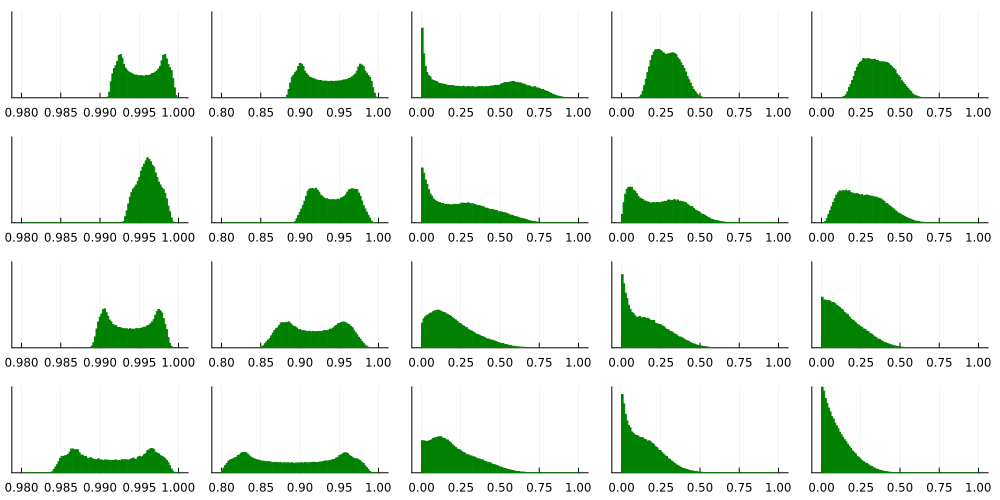

In [11]:
plot(plots...,layout=(length(g_range) + 1,length(κ_range)),ylims=(0,1.2e4),size=(1000,500),margin=1mm)

## Fig. 4 - Mean Loschmidt Echo

In [12]:
N,xrange = 65, 3.
x,dx = position_grid(N,xrange)
g_range = [0.,0.08,0.16,collect(0.25:.25:10)...]
κ_range = 0:.25:30

# load precomputed results for saving time/storage space
# mean_LE = [mean_loschmidt_echo(perturbed_coefficients(System(N = N, xrange = xrange, g = g, κ = κ))) for κ in κ_range, g in g_range]
mean_LE = load_data("coefficients/mean_loschmidt_echo.dat");

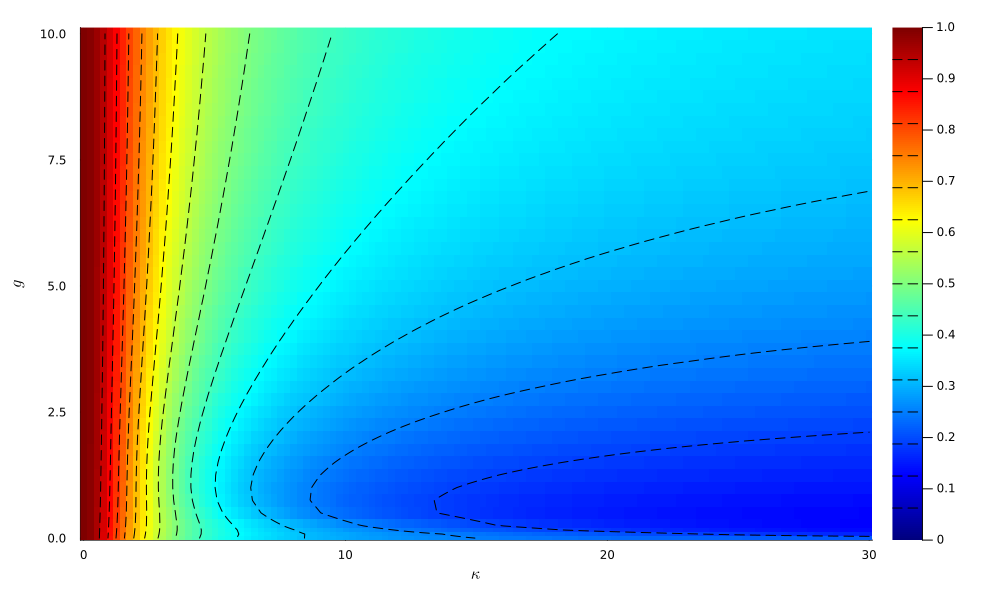

In [13]:
heatmap(κ_range,g_range,mean_LE,cmap=:jet,clims=(0,1),xlabel=L"\kappa",ylabel = L"g",size=(1000,600),margin=5mm) 
contour!(κ_range,g_range,mean_LE,color=:black,ls=:dash) 

## Fig. 5 - Beating

In [14]:
N, xrange = 129, 5.
g_range = 0.05:0.05:10
κ = 0.7 
tspan = 2*π*LinRange(0,15,7500)
LE = zeros(length(g_range),length(tspan))
coefficients = zeros(length(g_range),6)  

for (i,g) in enumerate(g_range)
    sys = System(N = N, xrange = xrange, g = g, κ = κ)
    energies = perturbed_energies(sys)
    a = perturbed_coefficients(sys)
    LE[i,:] = [loschmidt_echo(a,energies,t) for t in tspan]
    coefficients[i,:] = abs2.(a[1:6])
end

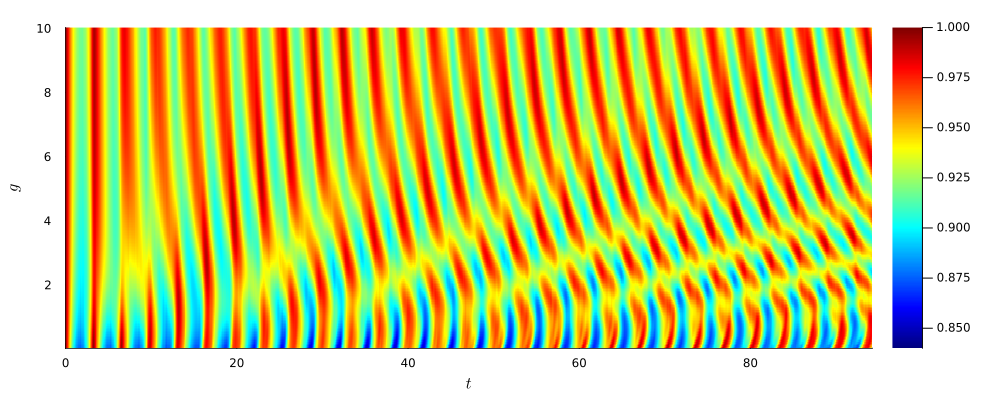

In [15]:
p = heatmap(tspan,g_range,LE,cmap=:jet,clims=(0.84,1.))
plot(p,xlabel=L"t",ylabel=L"g",size=(1000,400),margin=5mm)

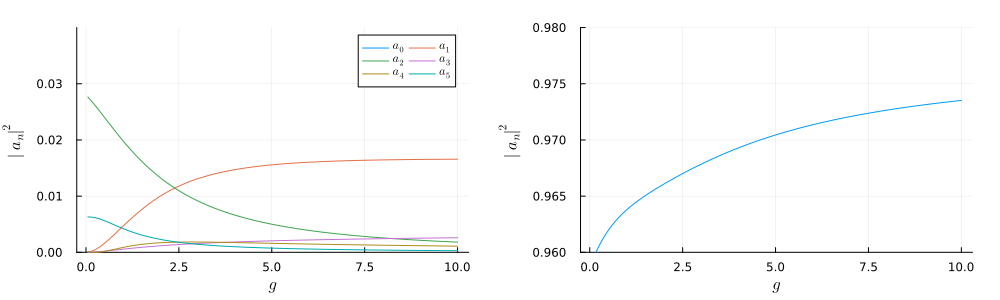

In [16]:
p1 = plot(g_range,coefficients,ylims=(0.,0.04),labels=[L"a_0" L"a_1" L"a_2" L"a_3" L"a_4" L"a_5" L"a_6"],legend_columns=2) 
p2 = plot(g_range,coefficients,ylims=(0.96,0.98),label="")
plot(p1,p2,xlabel=L"g",ylabel=L"|a_n|^2",size=(1000,300),margin=5mm)

## Fig. 6 - Spectral Function

In [25]:
N, xrange = 129, 5.
κ_range = -10:0.1:10
g_range = [2.5, 10.]
plots = []

for g in g_range
    p = plot()
    for κ in κ_range
        sys = System(N = N, xrange = xrange, g = g, κ = κ)
        energies = perturbed_energies(sys)
        a = perturbed_coefficients(sys)
        p = scatter!(energies,sys.κ*ones(length(energies)),zcolor=abs2.(a),markersize=2,markerstrokewidth=0,cmap=:viridis,label="")
    end
    annotate!(-40,8,L"g=%$(g)")
    push!(plots,p)
end

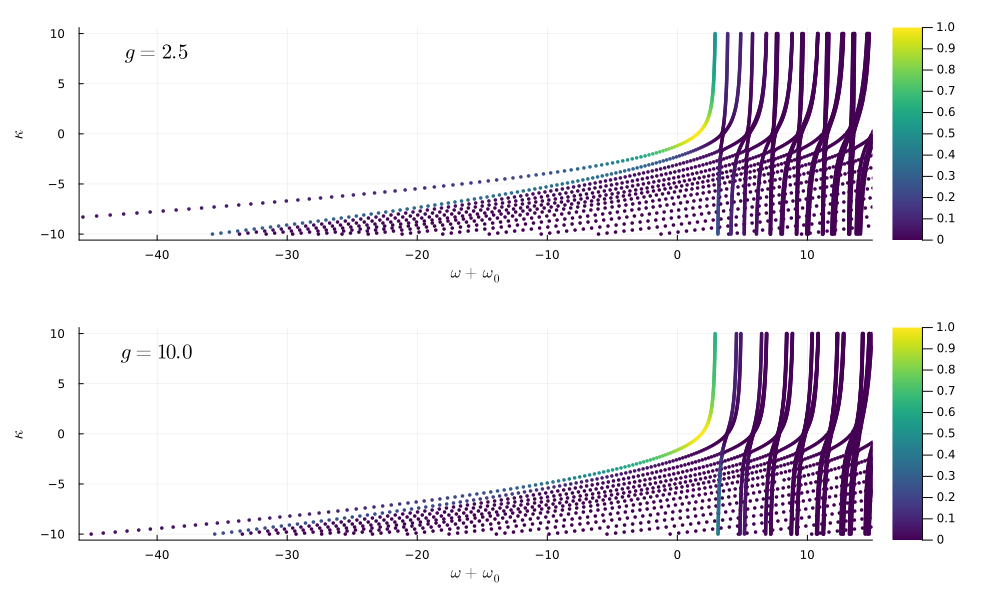

In [26]:
plot(plots...,layout=(2,1),xlims=(-46,15),clims=(0,1),xlabel=L"\omega + \omega_0",ylabel=L"\kappa",size=(1000,600),margin=5mm)

## Fig. 6 - Spectral Function Insets

In [19]:
range = (3,8)
ω,A = spectral_function(System(N = 129, xrange = 5., g = 2.5, κ = 0.7),discrete = false,range = range);
p1 = plot(ω,abs.(A),xlims=range,title=L"g = 2.5\quad\kappa = 0.7");

In [20]:
range = (-12,8)
ω,A = spectral_function(System(N = 129, xrange = 5., g = 10., κ = -5.),discrete = false,range = range);
p2 = plot(ω,abs.(A),xlims=range,title=L"g = 10\quad\kappa = -5");

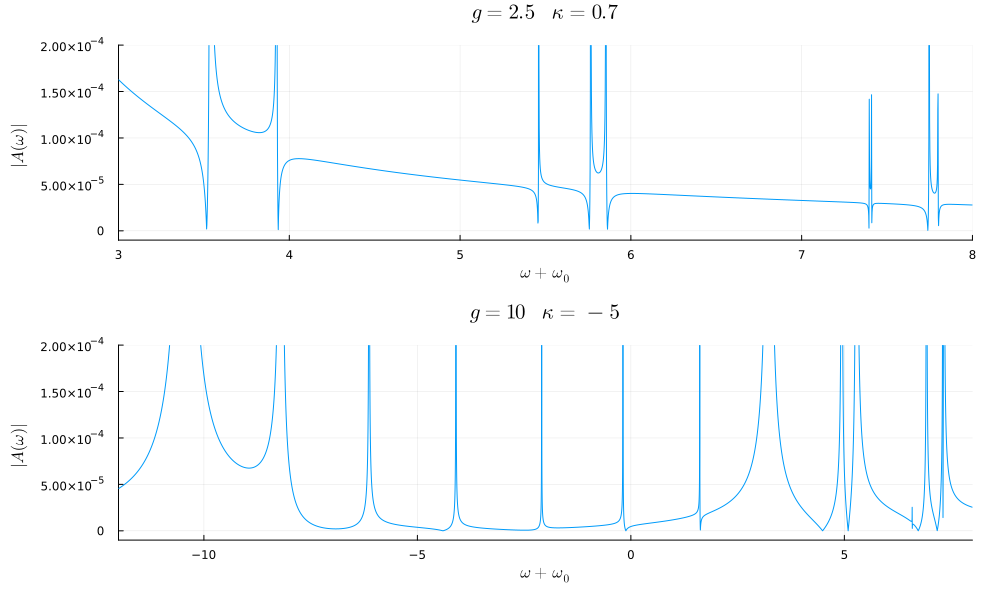

In [21]:
plot(p1,p2,layout=(2,1),ylims=(-1e-5,2e-4),yformatter=:scientific,label="",xlabel=L"\omega + \omega_0",ylabel=L"|A(\omega)|",size=(1000,600),margin=5mm)

## Fig. 7 - Spectral Function Tail

In [22]:
sys = System(N = 129, xrange = 5., g = 1., κ = 30.)
energies = perturbed_energies(sys)
a = perturbed_coefficients(sys);

# cleaning up coefficients for fitting 
inds = [(energies[i] < 25 && log(abs2(a[i])) < -4.5) || (25 < energies[i] < 50 && log(abs2(a[i])) < -5.5) || energies[i] > 250 || log(abs2(a[i])) > -3.5 || log(abs2(a[i])) < -7 ? false : true for i = 1:length(energies)]    
energies_clean = energies[inds]
a_clean = a[inds];

In [23]:
ω_range = LinRange(0,250,100)

@. exponential(x, p) = p[1] - p[2]*x
exp_fit = curve_fit(exponential, energies_clean, log.(abs2.(a_clean)), [1., 1.])
exponential_fit = [exponential(x,coef(exp_fit)) for x in ω_range]
    
@. power_law(x, p) = p[1] + p[2]*log(x)
pl_fit = curve_fit(power_law, energies_clean, log.(abs2.(a_clean)), [1., 1.])
power_law_fit = [power_law(x,coef(pl_fit)) for x in ω_range];

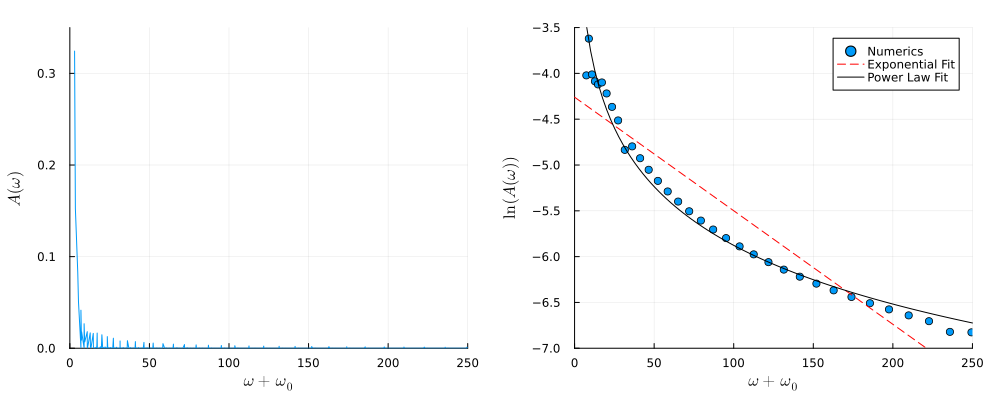

In [24]:
p1 = plot(spectral_function(sys)...,ylims=(0,0.35),label="",ylabel=L"A(\omega)")
p2 = scatter(energies_clean,log.(abs2.(a_clean)),ylabel=L"\ln(A(\omega))",ylims=(-7,-3.5),label="Numerics")
p2 = plot!(ω_range,exponential_fit,ls=:dash,color=:red,label="Exponential Fit")
p2 = plot!(ω_range,power_law_fit,color=:black,label="Power Law Fit")
plot(p1,p2,xlims=(0,250),xlabel=L"\omega + \omega_0",size=(1000,400),margin=5mm)